# FULL NETWORK VISUALIZATION


Bundling edges:

1. **Decay**: The rate at which the influence of a node diminishes as distance from the node increases.
   1. node typically has a stronger influence on bundling edges that are closer to it, and this influence weakens with increasing distance.
   2. A steeper decay function will make the bundling more localized, focusing on grouping edges that originate or terminate at the same node or its immediate neighbors. Conversely, a shallower decay function will result in looser groupings where edges from farther away nodes can potentially contribute to the bundle.
   3. In short: Higher values of decay will result in more localized bundling, while lower values will result in more global bundling.
2. **Bandwidth**:
   1. Bandwidth refers to the maximum width allocated to a bundle of edges at any point in the visualization.
   2. It controls the visual thickness of the bundled edges. A higher bandwidth creates thicker bundles, making them more prominent in the visualization. A lower bandwidth results in thinner bundles, allowing for better distinction between multiple overlapping bundles.
   3. In short: Higher values of bandwidth will result in thicker bundles, while lower values will result in thinner bundles.

I want to focus on the global structure of the network, so the decay value will be low (maybe .1?) and the bandwidth will be high (maybe .7?).


In [ ]:
expansion = {
    "0": "ocd, treatment, extension",
    "10": "ptsd, indication extension",
    "21": "pain, indication extension, treatment",
    "25": "weight management, treatment, indication extension",
    "31": "panic disorder, treatment, indication extension, ",
    "35": "anxiety, indication extension, treatment, ",
    "39": "psychodermatology, treatment, indication extension, ",
    "41": "alcoholism, treatment, indication extension, ",
    "42": "ibs,  treatment, indication extension, ",
    "43": "premature ejaculation, treatment, indication extension",
    "45": "sleep, treatment",
    "46": "eating, treatment, indication extension",
    "52": "bipolar, treatment, ",
    "55": "hot flashes, women , special population, treatment, indication extension",
    "63": "anxiety, treatment, indication extension, ",
    "61": "schizophrenia, treatment, indication extension,adjunctive therapy, review",
    "69": "autism, indication extension, children, adolescents,treatment",
    "93": "anxiety, pediatrics, paediatrics, children, review, treatment,",
    "96": "pathological laughing, neuroscience, clinical, treatment, indication extension",
    "99": "seasonal affective disorder sad, treatment, clinical, indication extension",
    "110": "migraine, headache, neuroscience,treatment, indication extension,",
    "111": "stress urinary incontinence (SUI), geriatrics, indication extension, treatment,",
    "118": "treatment, indication expansion, tics, tourette, ",
    "122": "dysthymia, treatment, clinical, review",
}

special_population = {
    "13": "children and adolescents, Pediatrics, special population",
    "22": "special populations, treatment, depression, clnical,",
    "26": "dementia, geriatrics, alzheimer, special population, treatment, depression",
    "38": "cancer, special population, oncology, oncoprevention, in vitro, ",
    "48": "parkinsion, geriatrics, special population",
    "56": "diabetes, special population, treatment, depression, ",
    "67": "epilepsy, special population, review",
    "68": "review, children, adolescents, prescription, safety, ",
    "70": "pmdd, indication extension, treatment,",
    "83": "geriatrics, depression, treatment, overview, review",
    "86": "liver, safety, treatment",
    "87": "bpd, treatment, indication extension, ",
    "93": "anxiety, pediatrics, paediatrics, children, review, treatment,",
    "102": "fibromyalgia, pain, indication extension, ",
    "106": "depression, cancer, special population, oncology, ",
    "114": "depression,kidney, special population, ",
}


safety = {
    "1": "pregnancy, safety, special population",
    "11": "sexual dysfunction, safety, side effect, ",
    "17": "safety, serotonin syndrome, treatment, ",
    "18": "cardiovascular, safety, treatment",
    "28": "suicide, safety, depression, pharmacovigilance, review, treatment, ",
    "33": "bleeding, safety, pharmacovigilance, treatment,",
    "37": "fracture, safety, pharmacovigilance,  geriatrics",
    "49": "drug/drug interaction, treatment, geriatrics, ",
    "50": "intoxication, safety, overdose, ",
    "68": "review, children, adolescents, prescription, safety, ",
    "71": "qtc, cardiology, safety,",
    "82": "hyponatremia, geriatrics, safety, treatment",
    "86": "liver, safety, treatment",
    "90": "withdrawal, safety, treatment,",
    "92": "lactation, breastfeeding, special population, review, children,",
    "100": "safety, review adverse effects, ",
    "115": "glaucoma, safety, treatment, ",
    "129": "galactorrhea, safety, advere effect, treatment, clinical, paroxetine",
}

drug_focus = {
    "60": "venlafaxine, ssri, depression, review",
    "66": "escitalopram, review, depression, ",
    "79": "citalopram, treatment, overview, review, ",
    "84": "sertraline, review, efficacy,",
    "105": "vilazodone, clinical, review, depression",
    "116": "agomelatine, depression, review, trials, ",
}

In [29]:
%load_ext autoreload
%autoreload 2
import pandas as pd
import networkx as nx
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# remove the SettingWithCopyWarning
import networkx as nx
from datashader.bundling import hammer_bundle
import plotly.express as px
from forceatlas2 import forceatlas2_networkx_layout
from datashader.layout import random_layout, circular_layout, forceatlas2_layout

import math
import numpy as np
import pandas as pd
import datashader as ds
import datashader.transfer_functions as tf
from datashader.layout import random_layout, circular_layout, forceatlas2_layout
from datashader.bundling import connect_edges, hammer_bundle

from itertools import chain

pd.options.mode.chained_assignment = None

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# create nodes and edges df


In [30]:
import pandas as pd


def graph_to_dataframes(G):
    # Nodes DataFrame
    nodes_data = [
        (node, data.get("cluster"), data.get("centrality_alpha0.3_k20_res0.005"))
        for node, data in G.nodes(data=True)
    ]
    nodes_df = pd.DataFrame(nodes_data, columns=["name", "cluster", "centrality"])
    nodes_df["cluster"] = nodes_df["cluster"].astype(int).astype("category")
    nodes_df["centrality"] = nodes_df["centrality"].astype(float)
    # drop centrality
    # nodes_df.drop(columns=["centrality"], inplace=True)
    nodes_df.index = [x.replace("n", "") for x in nodes_df["name"]]

    # Edges DataFrame
    edges_data = [
        (source, target, data.get("weight"))
        for source, target, data in G.edges(data=True)
    ]
    edges_df = pd.DataFrame(edges_data, columns=["source", "target", "weight"])
    edges_df["weight"] = edges_df["weight"].astype(float)
    edges_df["source"] = [x.replace("n", "") for x in edges_df["source"]]
    edges_df["target"] = [x.replace("n", "") for x in edges_df["target"]]
    # drop weight
    # edges_df.drop(columns=["weight"], inplace=True)

    print(f"Nodes DataFrame: {nodes_df.shape}")
    print(f"Edges DataFrame: {edges_df.shape}")

    return nodes_df, edges_df

In [64]:
pg = "../data/07-clustered-graphs/alpha0.3_k20_res0.005.graphml"
G = nx.read_graphml(pg)
pdf = "../data/06-clustered-df/alpha0.3_k20_res0.005.pkl"
df = pd.read_pickle(pdf)

pcd = "/Users/jlq293/Projects/Study-1-Bibliometrics/output/tables/cluster-explorer/FinalSelect/SingleSolExplorer_alpha0.3_k20_res0.005.xlsx"
# first sheet is the cluster details
cluster_details = pd.read_excel(pcd, sheet_name=0)

# create dataframes from subgraph


In [65]:
import pandas as pd

# use a subgraph of the cluster 1-10
# clusters_to_keep = list(range(15, 20))
clusters_to_keep = [25, 13, 26, 22, 11, 28]
G = G.subgraph([n for n, d in G.nodes(data=True) if d["cluster"] in clusters_to_keep])

nodes_df, edges_df = graph_to_dataframes(G)
print("Nodes DataFrame:")
print(nodes_df.head(3))
print("\nEdges DataFrame:")
print(edges_df.head(3))

Nodes DataFrame: (2802, 3)
Edges DataFrame: (46125, 3)
Nodes DataFrame:
         name cluster  centrality
39596  n39596      28    0.194746
9496    n9496      13    0.075251
37047  n37047      26    0.032710

Edges DataFrame:
  source target    weight
0  39596   1923  0.659400
1  39596   2653  0.656811
2  39596   3478  0.654387


# plot the network


In [95]:
cvsopts = dict(plot_height=1800, plot_width=1800)


def edgesplot(edges, name=None, canvas=None, edge_color=(220, 220, 220)):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    return tf.shade(
        canvas.line(edges, "x", "y", agg=ds.count()), name=name, cmap=[edge_color]
    )


def graphplot(nodes, edges, name="", canvas=None, cat=None):
    if canvas is None:
        xr = nodes.x.min(), nodes.x.max()
        yr = nodes.y.min(), nodes.y.max()
        canvas = ds.Canvas(x_range=xr, y_range=yr, **cvsopts)

    np = nodesplot(nodes, name + " nodes", canvas, cat)
    ep = edgesplot(edges, name + " edges", canvas)
    legend_handles = []
    if cat is not None:
        cmap = plt.get_cmap("tab10")
        categories = nodes[cat].unique()
        for category in categories:
            color = cmap(categories.tolist().index(category))
            legend_handles.append(
                plt.Line2D(
                    [0],
                    [0],
                    marker="o",
                    color="w",
                    label=category,
                    markerfacecolor=color,
                    markersize=10,
                )
            )
    plt.legend(handles=legend_handles)
    return tf.stack(ep, np, how="over", name=name)


def nodesplot(nodes, name=None, canvas=None, cat="cluster", cmap=plt.get_cmap("tab10")):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    aggregator = None if cat is None else ds.count_cat(cat)
    agg = canvas.points(nodes, "x", "y", aggregator)
    return tf.spread(tf.shade(agg, cmap=cmap, alpha=1), px=15, name=name)

"Force-directed, bundled"

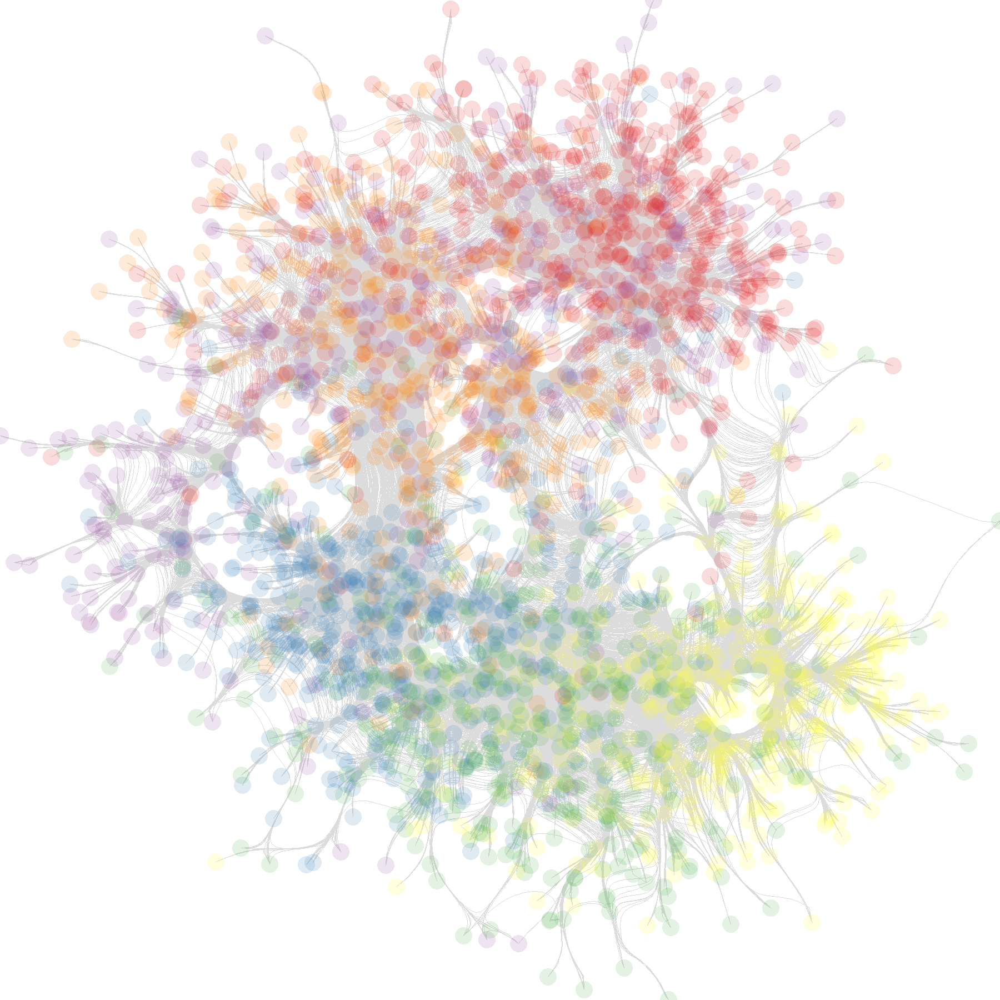

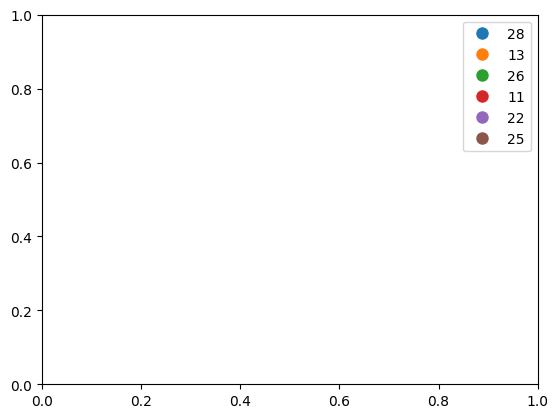

In [96]:
forcedirected = forceatlas2_layout(nodes_df, edges_df)

bundled_edges = hammer_bundle(
    forcedirected, edges_df, decay=0.1, initial_bandwidth=0.25, iterations=10
)
fd_b = graphplot(
    forcedirected,
    bundled_edges,
    "Force-directed, bundled",
    cat="cluster",
)

tf.Images(fd_b)

"Force-directed, bundled"

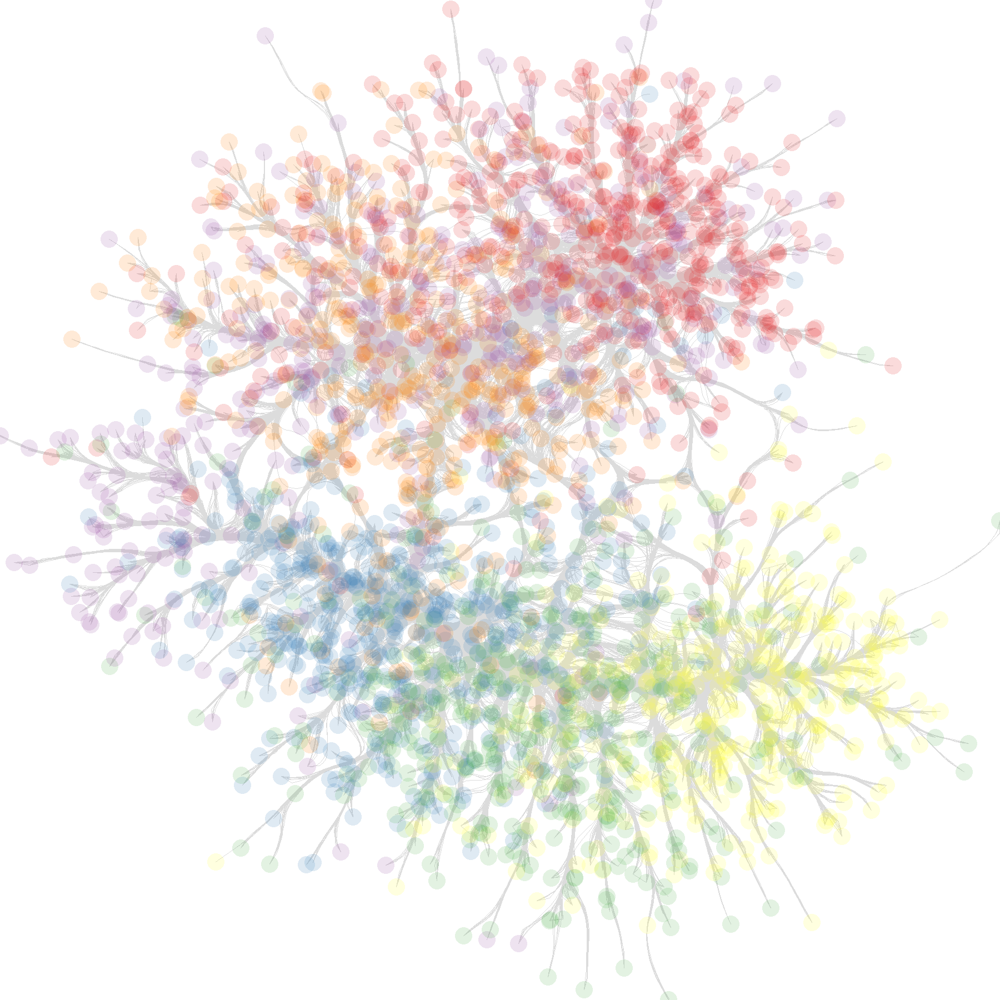

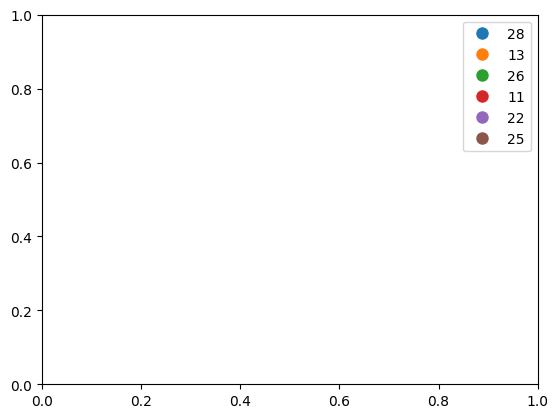

In [97]:
bundled_edges = hammer_bundle(
    forcedirected, edges_df, decay=0.2, initial_bandwidth=0.5, iterations=10
)
fd_b = graphplot(
    forcedirected,
    bundled_edges,
    "Force-directed, bundled",
    cat="cluster",
)

# save image
fd_b.to_pil().save("../output/figures/force-directed-bundled.png")

tf.Images(fd_b)

higher initial bandwidth and higher decay time constants leading to larger-scale bundling


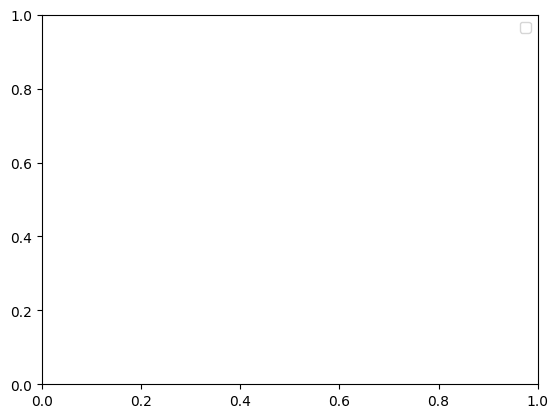

In [100]:
grid = [
    graphplot(
        forcedirected,
        hammer_bundle(
            forcedirected, edges_df, iterations=5, decay=decay, initial_bandwidth=bw
        ),
        "d={:0.2f}, bw={:0.2f}".format(decay, bw),
    )
    for decay in [0.1, 0.25, 0.5, 0.9]
    for bw in [0.1, 0.2, 0.5, 1]
]

"d=0.10, bw=0.10","d=0.10, bw=0.20","d=0.10, bw=0.50","d=0.10, bw=1.00"
"d=0.25, bw=0.10","d=0.25, bw=0.20","d=0.25, bw=0.50","d=0.25, bw=1.00"
"d=0.50, bw=0.10","d=0.50, bw=0.20","d=0.50, bw=0.50","d=0.50, bw=1.00"
"d=0.90, bw=0.10","d=0.90, bw=0.20","d=0.90, bw=0.50","d=0.90, bw=1.00"

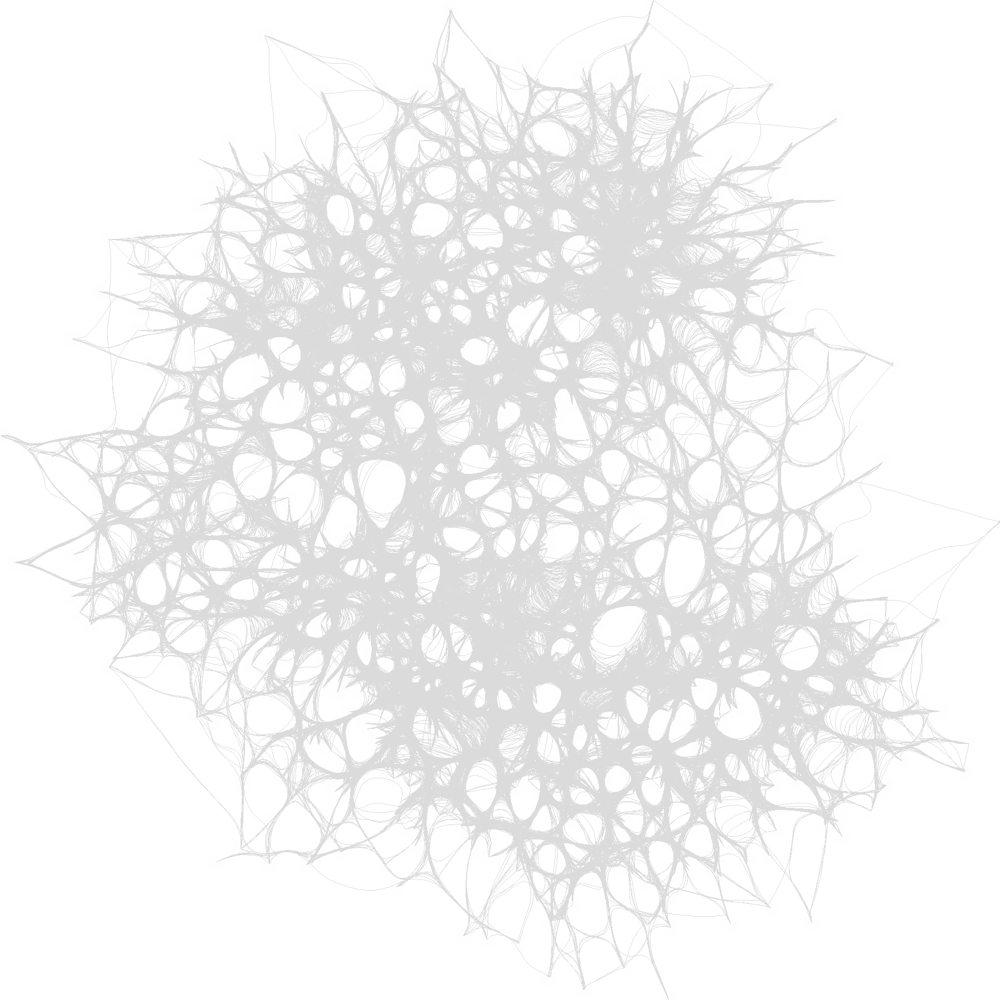
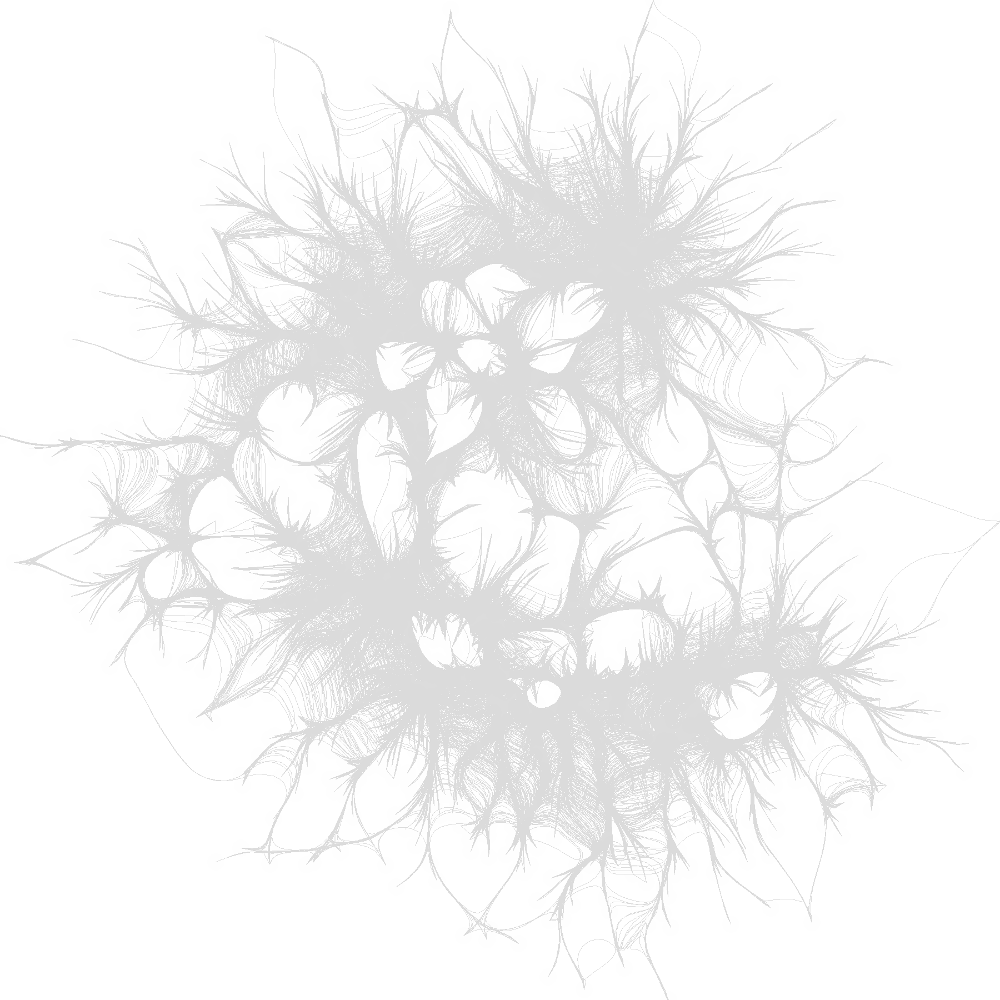
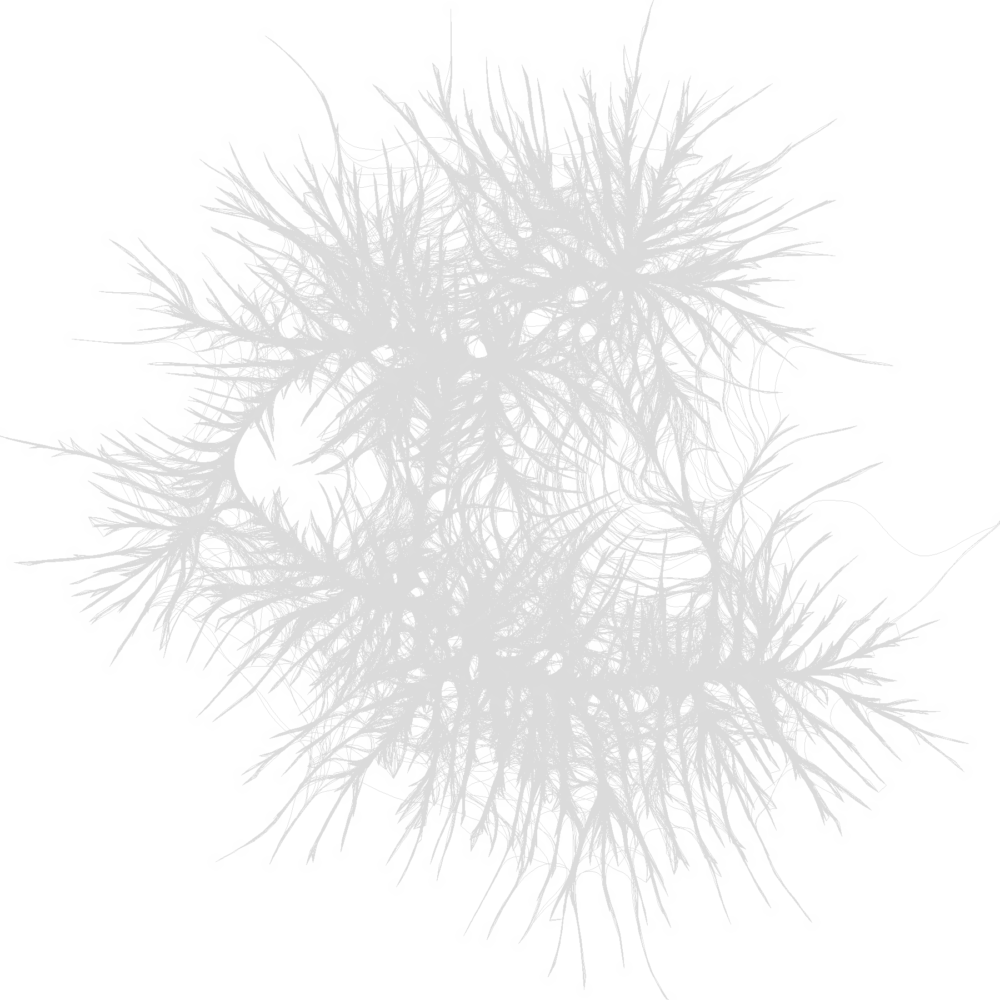
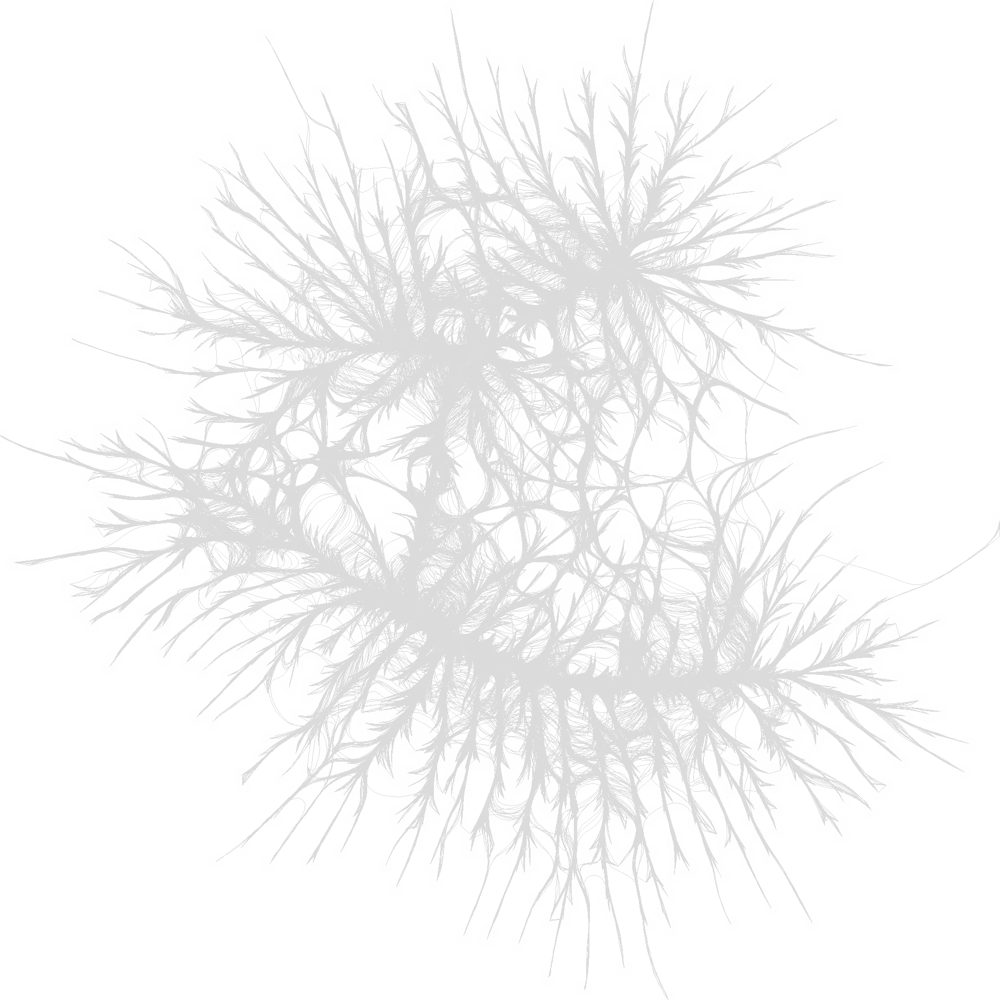
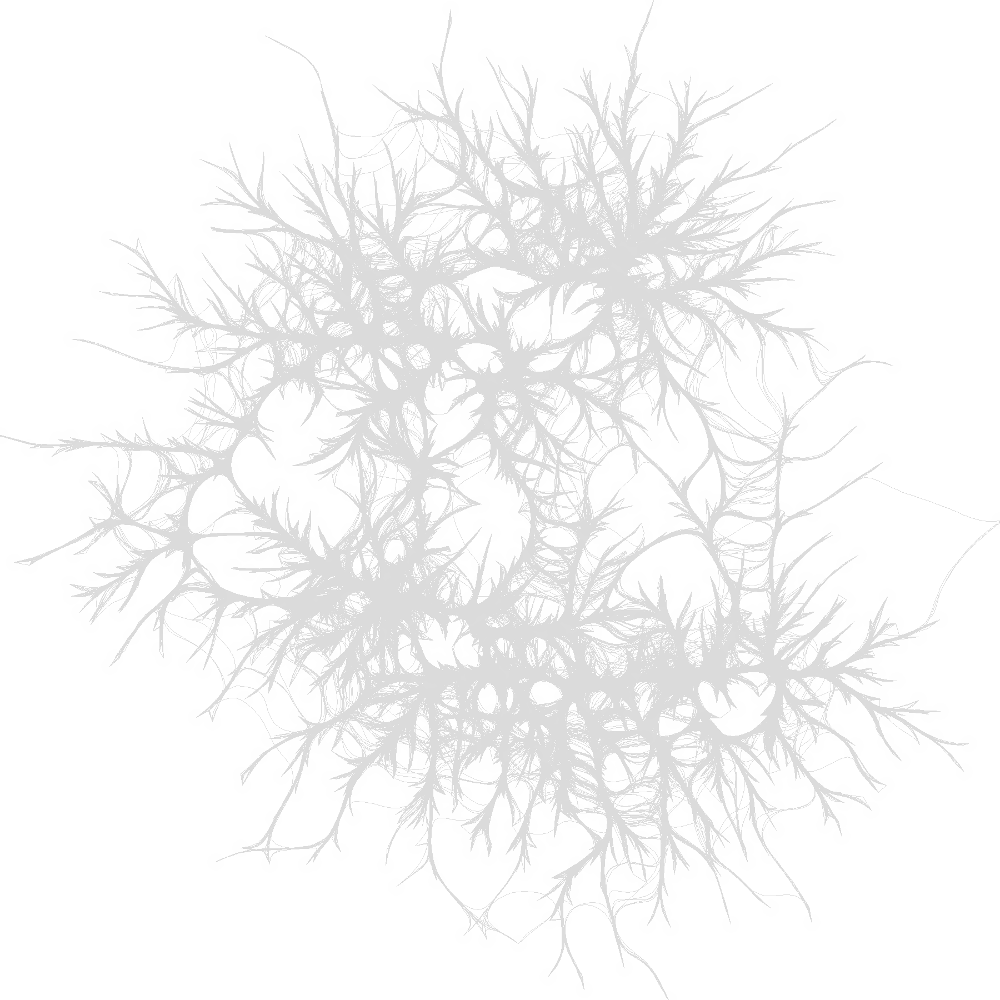
...
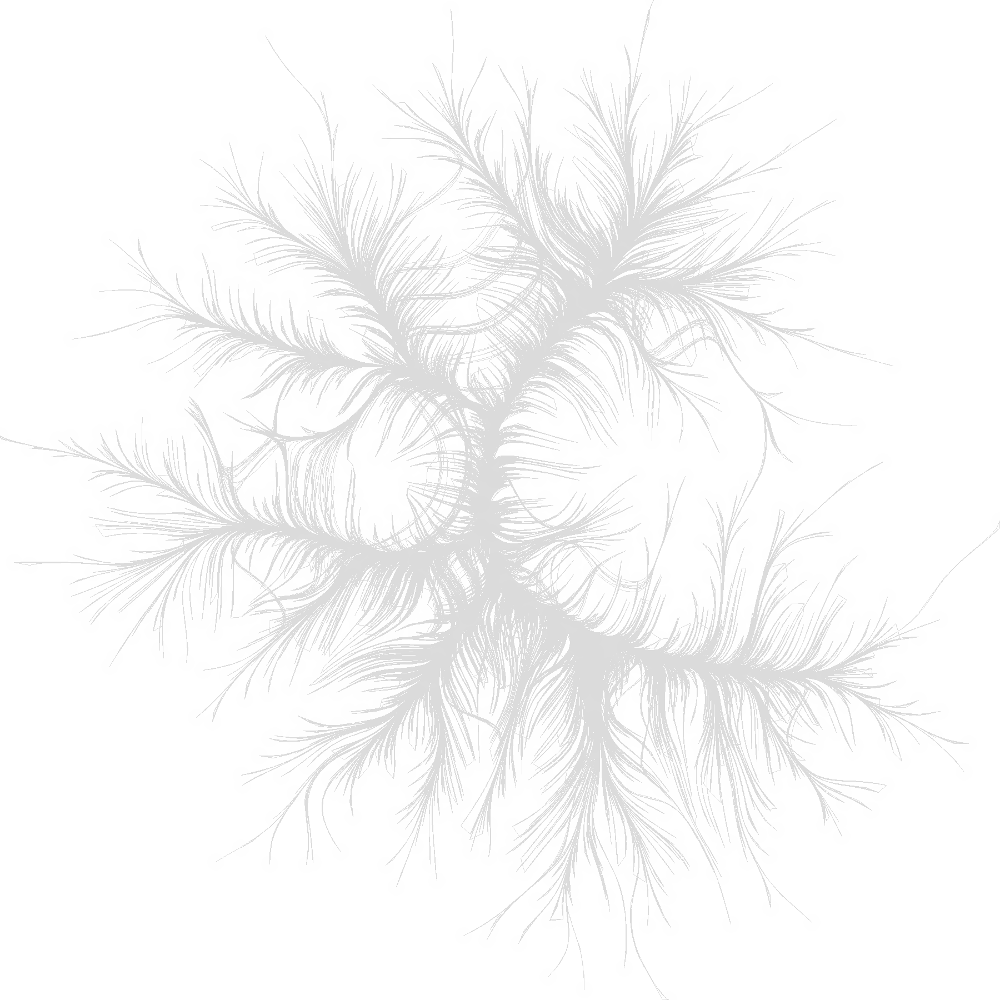
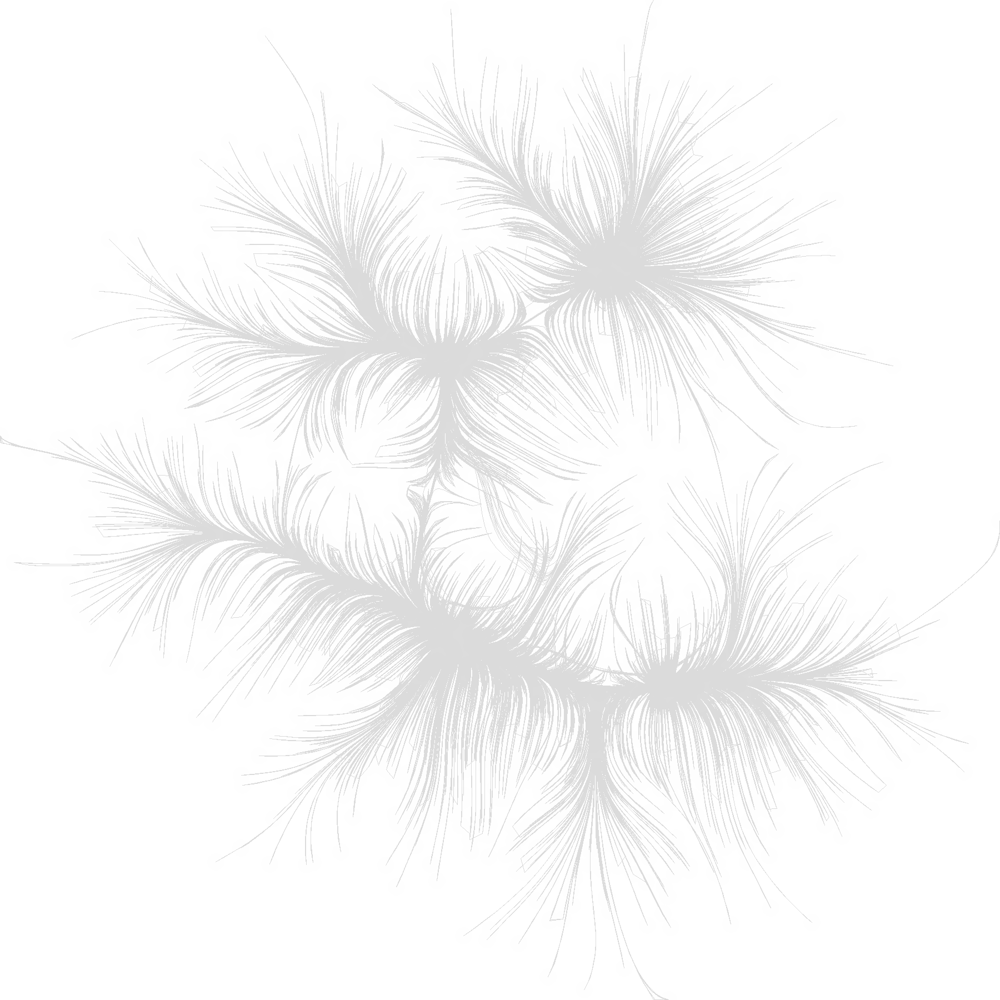
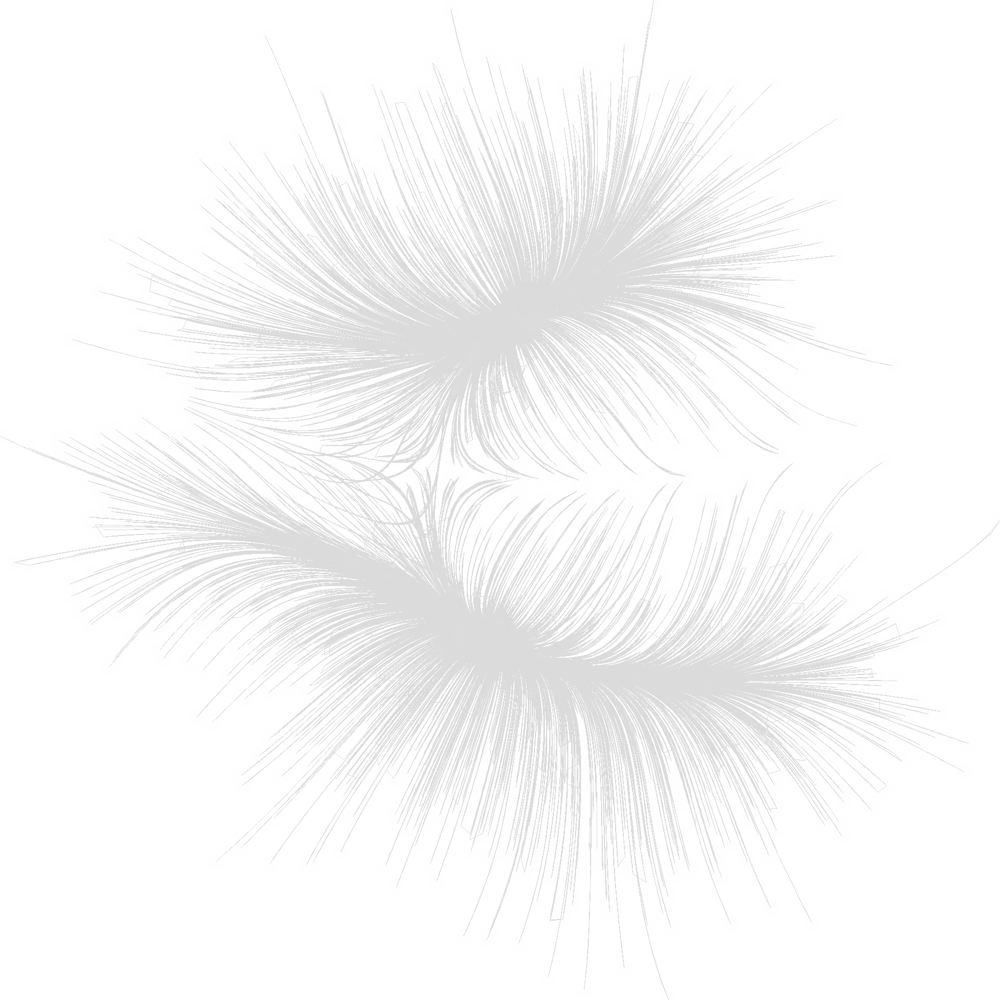
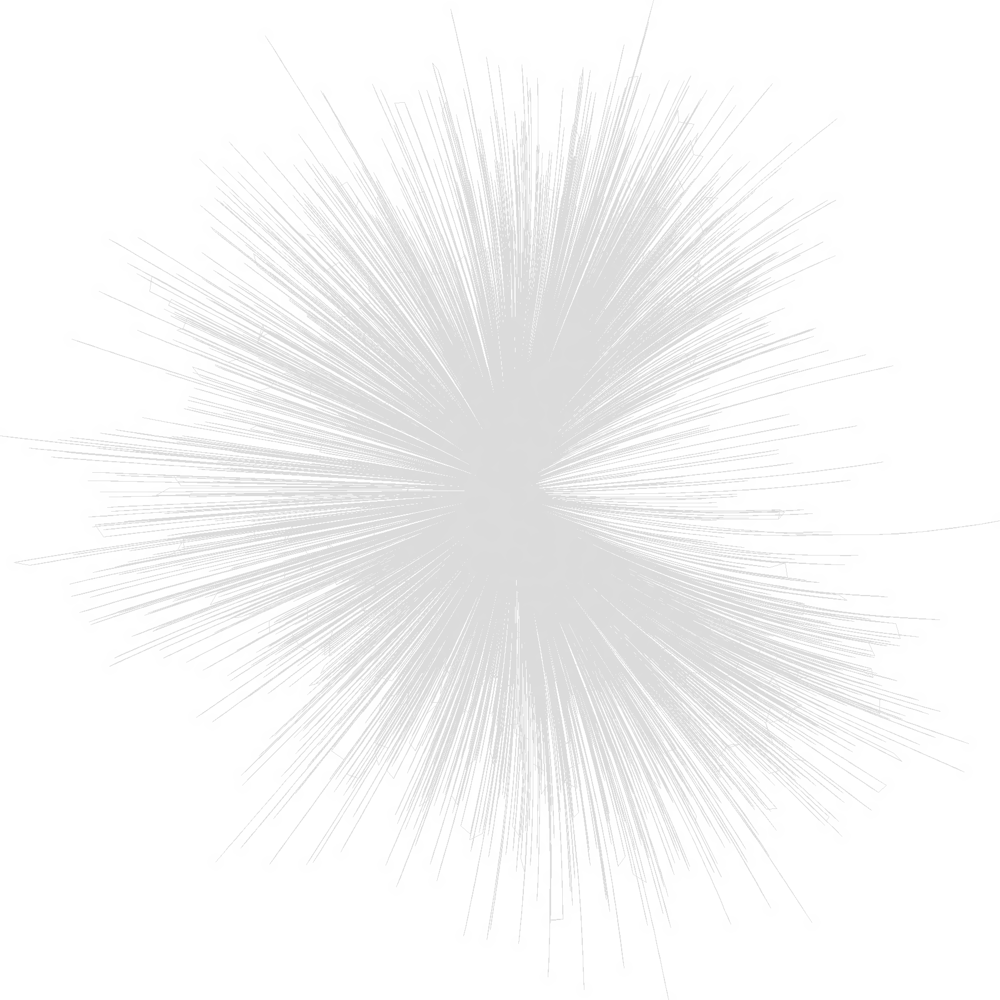
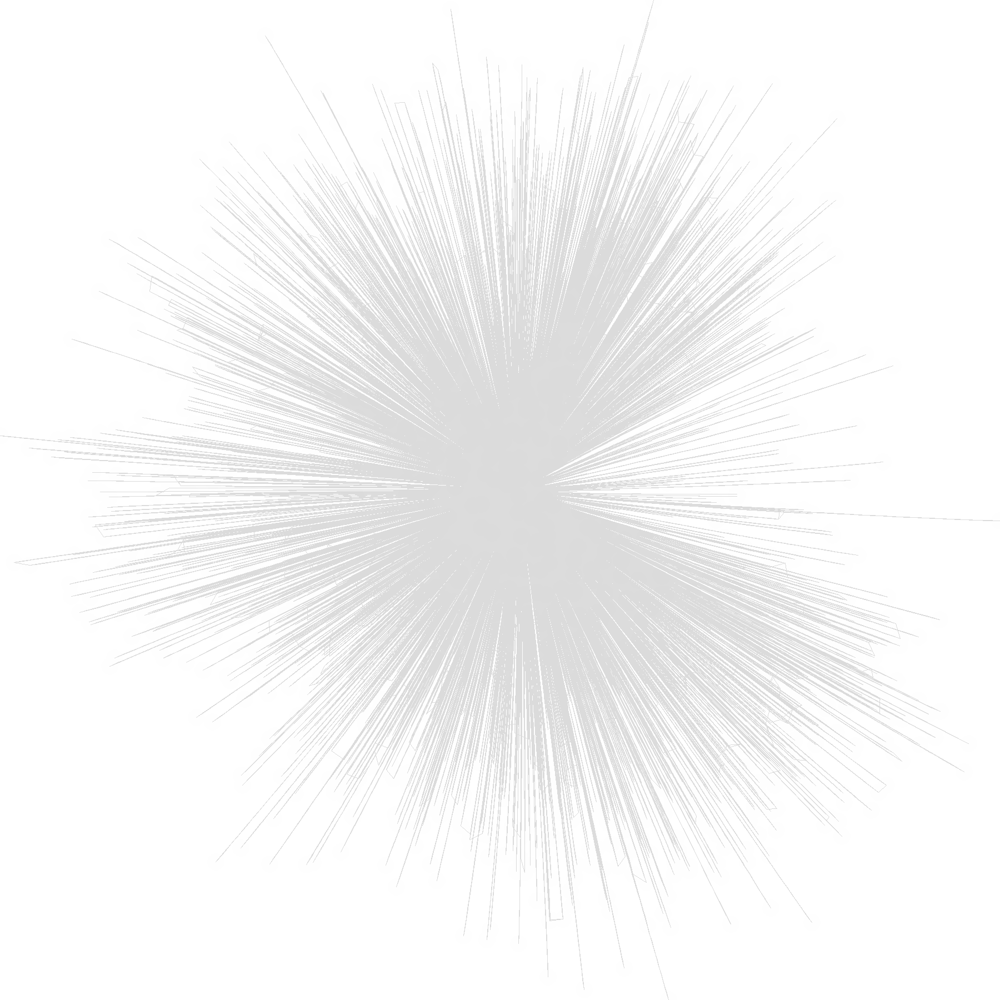

In [101]:
tf.Images(*grid).cols(4)

# with clusters


In [ ]:
nodes_df

,name,cluster,centrality
8136,n8136,11,0.281145
6792,n6792,11,0.178985
33111,n33111,13,0.131220
34348,n34348,10,0.065841
21331,n21331,11,0.022044
...,...,...,...
26555,n26555,14,0.071707
8957,n8957,12,0.167165
13618,n13618,11,0.175294
15016,n15016,14,0.025992


In [ ]:
def datashader_prep(nodes_df, edges_df):
    # nodes_df.drop(columns=["centrality"], inplace=True)
    nodes_df.index = [x.replace("n", "") for x in nodes_df["name"]]
    # rename to name
    nodes_df.rename(columns={"node": "name"}, inplace=True)

    # edges_df
    edges_df["source"] = [x.replace("n", "") for x in edges_df["source"]]
    edges_df["target"] = [x.replace("n", "") for x in edges_df["target"]]
    # drop weight
    edges_df.drop(columns=["weight"], inplace=True)
    return nodes_df, edges_df


cnodes, cedges = datashader_prep(nodes_df, edges_df)

In [ ]:
nodes_df

,name,cluster,centrality
8136,n8136,11,0.281145
6792,n6792,11,0.178985
33111,n33111,13,0.131220
34348,n34348,10,0.065841
21331,n21331,11,0.022044
...,...,...,...
26555,n26555,14,0.071707
8957,n8957,12,0.167165
13618,n13618,11,0.175294
15016,n15016,14,0.025992


In [ ]:
fd = forceatlas2_layout(nodes_df, edges_df)

In [ ]:
bundles = hammer_bundle(fd, edges_df, decay=0.5, initial_bandwidth=0.2)

TypeError: descriptor '_obj' for 'DelayedLeaf' objects doesn't apply to a 'DelayedLeaf' object

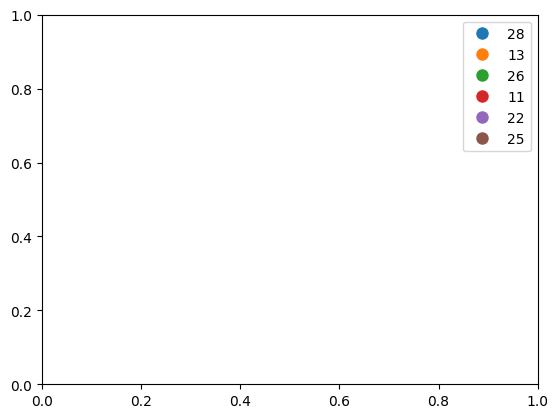

In [98]:
fd_b = graphplot(
    forcedirected,
    hammer_bundle(forcedirected, edges_df, decay=0.5, initial_bandwidth=0.2),
    "Force-directed, bundled",
    cat="cluster",
)

"Force-directed, bundled"

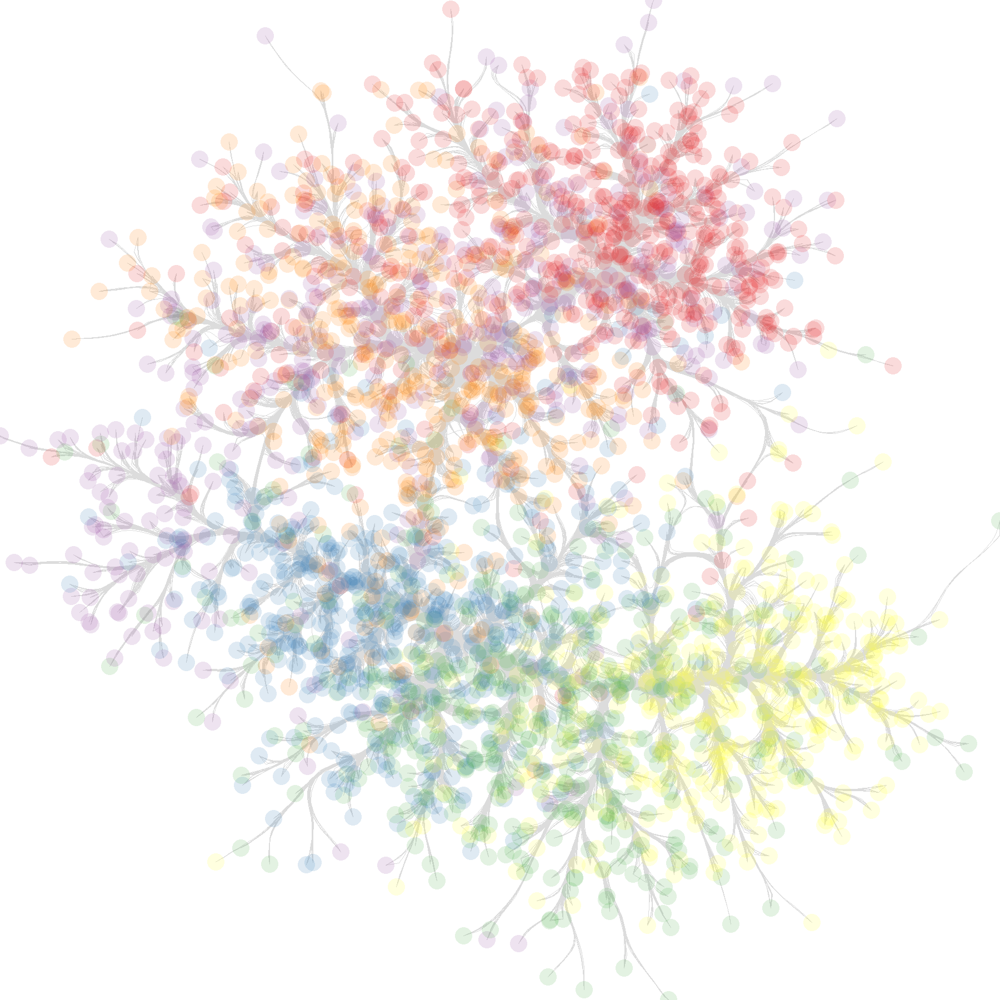

In [99]:
tf.Images(fd_b)

In [71]:
list(G.nodes(data=True))[0]

('n39596',
 {'doi': '10.1891/EHPP-2022-0015',
  'year': 2023.0,
  'title': 'Antidepressants and Suicide: 7,829 Inquests in England and Wales, 2003–2020',
  'eid': '2-s2.0-85160096103',
  'id': 'Read_2023',
  'cluster': 28.0,
  'centrality_alpha0.3_k20_res0.005': 0.194745875459755})

AttributeError: 'int' object has no attribute 'intersection'

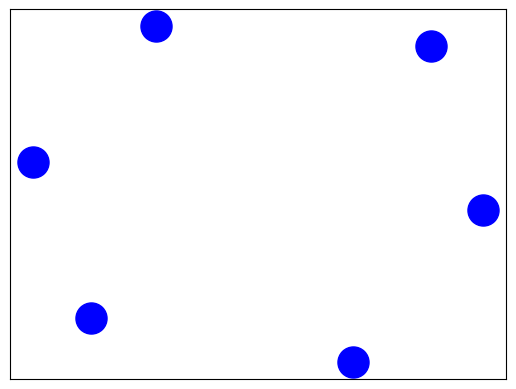

In [75]:
# clusters_to_keep
partition = clusters_to_keep
cluster_graph = nx.Graph()

# Create a new graph for clusters
cluster_graph = nx.Graph()

# Add cluster nodes to the new graph
for i, cluster in enumerate(partition):
    cluster_graph.add_node(i)

# Compute positions for cluster nodes using ForceAtlas2 layout
pos_clusters = nx.spring_layout(cluster_graph)

# Plot the cluster nodes
nx.draw_networkx_nodes(cluster_graph, pos_clusters, node_size=500, node_color="b")

# Plot the edges between cluster nodes
for i in range(len(partition)):
    for j in range(i + 1, len(partition)):
        if len(partition[i].intersection(partition[j])) > 0:
            cluster_graph.add_edge(i, j)

nx.draw_networkx_edges(cluster_graph, pos_clusters, edge_color="gray")

# Plot the nodes within each cluster separately
for i, cluster in enumerate(partition):
    pos = nx.spring_layout(
        G.subgraph(cluster), seed=i
    )  # Compute positions for nodes within each cluster
    nx.draw_networkx_nodes(
        G.subgraph(cluster), pos, node_size=100, node_color="r", alpha=0.5
    )

plt.axis("off")
plt.show()

In [ ]:
import colorcet as cc

In [ ]:
import pandas as pd
import holoviews as hv
from holoviews import opts

from colorcet import fire
from datashader.bundling import directly_connect_edges, hammer_bundle

from holoviews.operation.datashader import datashade, dynspread
from holoviews.operation import decimate

from dask.distributed import Client

In [ ]:
from dask.distributed import Client

AttributeError: module 'dask' has no attribute 'utils'